# EDA

## 1.Importar paquetes

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path  # :robot:
from scipy.stats import skew, kurtosis, f_oneway
import plotly.graph_objects as go
import plotly.express as px
sns.set_theme(style='whitegrid')


## 2.Carga de los datos :robot:


In [21]:
repo_root = Path.cwd()
if not (repo_root / "README.md").exists():
    repo_root = repo_root.parent
repo_root = repo_root.resolve()  # Ruta raíz del repositorio actual :robot:


In [22]:
datos = 'trabajo_resultado_calidad.pickle'

In [23]:
ruta_completa = repo_root / '02_Datos' / '03_Trabajo' / datos
df = pd.read_pickle(ruta_completa)

# Primer vistazo al dataset :robot:
print(df.shape)
df.head()


In [24]:
num = df.select_dtypes(include='number').columns.tolist()
cat = df.select_dtypes(exclude='number').columns.tolist()
# Selección automática de columnas numéricas y categóricas :robot:


## 3. Analisis estadistico :robot:


### 3.1 Medidas descriptivas

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
spkid,88292.0,2.153282e+06,1.311716e+05,2.000001e+06,2.044516e+06,2.114402e+06,2.240091e+06,2.539759e+06
H,88292.0,1.504616e+01,1.331944e+00,3.400000e+00,1.440000e+01,1.520000e+01,1.590000e+01,2.290000e+01
diameter,88292.0,5.750410e+00,9.818393e+00,8.300000e-02,2.931000e+00,4.148000e+00,5.972000e+00,9.394000e+02
albedo,88292.0,1.348911e-01,1.125021e-01,1.000000e-03,5.400000e-02,8.100000e-02,2.000000e-01,1.000000e+00
diameter_sigma,88292.0,4.777132e-01,8.568135e-01,3.000000e-03,1.750000e-01,3.210000e-01,6.130000e-01,1.400000e+02
e,88292.0,1.435945e-01,7.364268e-02,3.094994e-04,8.949653e-02,1.378775e-01,1.891557e-01,9.683957e-01
a,88292.0,2.815932e+00,5.951860e-01,6.262100e-01,2.548085e+00,2.755614e+00,3.094442e+00,6.635270e+01
q,88292.0,2.416063e+00,5.164663e-01,8.181996e-02,2.080125e+00,2.376833e+00,2.695444e+00,4.031871e+01
i,88292.0,9.860502e+00,6.452417e+00,2.205988e-02,4.865190e+00,8.977301e+00,1.320230e+01,1.703346e+02
om,88292.0,1.691474e+02,1.024615e+02,1.565173e-03,8.206362e+01,1.598267e+02,2.539218e+02,3.599932e+02


Las variables se puede dividir en 3 grupos: caracteristicas fisicas del asteroide, parametros orbitales e incertidumbre denotadas con la sufijo o prefijo **sigma**. Los dos primeros grupos son los que se analizan, dado que permiten entender el fenomeno. 

Sobre las caracterisitcas fisicas:

- **H** que es la magnitud absoluta del brillo intrínseco del asteroide. Al ver que la media y desviación estandar tiene un orden de magnitud de diferencia se puede entender que la mayoria de muestras tiene un valor de **H** similar.

- **diameter** es el diametro estimado del asteroide. Si bien esta variable no presenta diferencias en ordenes de magnitud respecto a su media y desviación estandar hay que tener algunas consideración al respecto. La primera es que no se indica la unidad de medida de esta variable, por lo cual no se puede dimensionar con seguridad si el dato es una reprensentación adecuada. La segunda es la diferencia de 4 ordenes de magnitud entre el valor minimo y el maximo lo que puede indicar que el especto más amplio de lo que aparenta.

- **albedo** indica la refletividad que tiene la superficie del asteroide. Al igual que con el diametro, no hay diferencia entre la media y desviacion estandar, además de tener una diferencia de 3 ordenes de magnitud entre el valor min y el max. Pensando en el calculo de esta variable, las ideas que se puede tener es que me mide que tanto se demora una luz emitida al asteroide en volver o cuanta luz se reflecta al momento de observarlo (aunque puede que ambas ideas en la  practica sean la misma), con esto en consideración esta variable habla sobre la composición material del asteroide.

Respecto a los parametros orbitales:

- **e** excentricidad de la orbita. Dependiendo del tipo de orbita que tenga el asteroide su excentricidad esta determinada a ciertos valores. En este caso dado que el los valores oscilan entre 0.000309 y 0.96 con una desviacion estandar de 0.85 las orbitas son elipticas probablemente con el centro en la tierra.

- **a** semi-eje mayor una de las caracteristicas de las elipses. Esta variable es interesante dado que los valores min y max tiene un diferencia de 2 ordenes de magnitud, pero la desviación estandar es del ordern de $10^{-1}$ lo que se interpreta como que los valores en general no estan estan dispersos. Capaz muchos de los asteroides tiene orbitas similares.

- **q** distancia del perihelio, es decir el punto de la orbita más cercano al Sol. El comportamiento de esta variable se muestra similar al semi-eje mayor. Quizas sea mas certero decir que las orbitas tiene ciertas coincidencias a que son similares o la posibilidad de que estos asteroides pertenezca al mismo cinturón.

- **i** es la inclinación de la orbita respecto al plano orbital de la Tierra. Este es un dato complejo de interpretar al no conocer su unidad de medida, lo habitual seria en radianes. Pero el rango de los datos es tan amplio que la unidad correcta en realidad sea grado. En ese caso la interpretación es que la colección de datos contienen orbitas eliptica con una pequeña inclinación respecto al plano de referencia y algunas que van en sentido contrario al ser mayores a 90°.

- **om** es el punto en el cual el asteroide cruza el ecuador de la orbita de sur a norte, describiendo la orientación de la orbita. Este valor esta relacionado con los parametros **i** y **w**, tal que para tener una mejor comprensión se hace un grafico con estas tres variables.

- **w** es el argumento o posición del perihelio. El rango de esta parametro varia bastante, tal que las orbitas pueden ser similares en la forma del trayecto pero no en el tamaño.

- **ma** es un angulo que representa la posicion del asteroide en la orbita en un momento especifico, bajo la suposición de que él mismo se encuentro dentro de una orbita circular con velocidad constante. Al considerar que se mide en grados, los datos cubre los 360°.

- **ad** es la distancia al aphelio, es decir el punto de la orbita más alejado del Sol. Al igual que con el perihelio, la desviación estandar es baja con un orden de $10^{-1]$ y el rango de valores oscila entre 2 ordenes de magnitud.

- **n** es la cantidad de grados promedios que recorre el asteroide. Los cuales varian dependiento del asteroide, dado el rango que tienen los datos.

- **tp** es el tiempo en que el asteroide pasa por el perihelio, mientras que **tp_cal** es representa el mismo valore pero en el calendario. Considerando el rango de los datos y la diferencia de ordenes de magnitud de la media con la desviación estandar, se puede inferir que la mayoria de asteroide pasar por el perihelio en instantes cercanos.

- **per** es periodo que representa el tiempo que el toma al asteroide dar un vuelta alrededor del Sol y **per_y** contiene la misma información pero en años. Al ver las diferencias de rango entre los datos, se traduce en que algunos asteroides completan la vuelta antes que otros, lo que se puede transladar a que son más rapido o tiene trayectorias más cortas.

- **moid** es la distancia más corta entre la orbita de la Tierra y del asteroide, por su parte **moid_ld** es el mismo dato pero con otra unidad de medida. Este parametro ayuda a indentificar la peligrosidad del asteroide, al ser menor a 0.05 se considera peligroso. Los valores bajo del dataset se encuentro en ese rango, lo que es consistente con la clasificación que existe en la variable **pha**.

- **rms** es el error asociado a los parametros de la orbita. En este dataset es bajo, tal que indica una suerte de fidelidad respecto a la calidad de la información.

Este listado deberia dar nociones suficientes para entender mejor los datos además de establecer necesidad de revisar si las orbitas son similares como parece indicar la primera interpretación de los datos. 

### 3.2 Asimetria y Curtosis

Utilizando medidas estadisticas como la asimetria y curtosis. La primera determina como su nombre indica mide la asimetria de la distribución en torno a la media, mientras que la segunda mide la agudeza y planitud de la distribución determinando así cuantos valores atipicos extremos tiene respecto a una distribucón normal.

Una forma sencilla de evaluar estas medidas es:

1.- Asimetria o Skew:

- Shew $\approx$ 0 $\rightarrow$ es simetrica la distribución
- Shew > 0 $\rightarrow$ inclinada hacia la derecha
- Shew < 0 $\rightarrow$ inclinada hacia la izquierda

2.- Curtosis:

- Curtosis > 3 $\rightarrow$ más outliers (más datos en las colas de la distribución)

- Curtosis < 3 $\rightarrow$ distribución mas plana

Aplicando este test a los datos numericos se tiene que

In [19]:
print('Asimetria y Kurtosis: ')
for var in num:
    print(f'{var:<15} Skew: {skew(df[var].dropna()):>6.2f} | Kurtosis: {kurtosis(df[var].dropna()):>6.2f}')

Asimetria y Kurtosis: 
H               Skew:  -1.04 | Kurtosis:   3.52
diameter        Skew:  27.23 | Kurtosis: 1853.06
albedo          Skew:   1.61 | Kurtosis:   3.64
diameter_sigma  Skew:  73.04 | Kurtosis: 9698.98
e               Skew:   1.12 | Kurtosis:   5.22
a               Skew:  27.92 | Kurtosis: 2138.36
q               Skew:   7.90 | Kurtosis: 390.06
i               Skew:   1.29 | Kurtosis:   6.48
om              Skew:   0.20 | Kurtosis:  -1.11
w               Skew:  -0.03 | Kurtosis:  -1.21
ma              Skew:  -0.06 | Kurtosis:  -1.23
ad              Skew:  47.96 | Kurtosis: 4995.03
n               Skew:   5.59 | Kurtosis: 108.89
tp              Skew:  -3.39 | Kurtosis: 206.00
tp_cal          Skew:  -3.17 | Kurtosis: 187.55
per             Skew: 100.20 | Kurtosis: 15551.36
per_y           Skew: 100.20 | Kurtosis: 15551.36
moid            Skew:   8.11 | Kurtosis: 399.01
moid_ld         Skew:   8.11 | Kurtosis: 399.01
sigma_e         Skew: 208.66 | Kurtosis: 51358.94
sigma_a

Las variables se reparten de la siguiente manera:

1.- Shew $\approx$ 0 y Curtosis < 3: **om**, **w**, **ma**, **rms** son las variables con distribución homogenea y pocos outliers

2.- Shew < 0 y Curtosis > 3: **H**, **tp** y **tp_cal** tiene una tendencia hacia la izquierda junto a un número considerable de outliers

3.- Shew > 0 y Curtosis > 3: **diameter**, **albedo**, **e**, **q**, **a**, **i**, **ad**, **n**, **per**, **per_y**, **moid**, **moid_ld** pertenecen al grupo de variables con tendencia hacia la derecha y altos outliers en los datos

Ahora seria un buen momento para hacer un conteo de los outliers por variables y tambien de tomar una decisión sobre que hacer con ellos.

### 3.3 Outliers

Definiendo la función para buscar los outliers que tienen las variables numericas

In [24]:
def detectar_outliers(df, lista):
    outliers_count = {}
    for col in lista:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        outliers = df[(df[col] < lower) | (df[col] > upper)]
        outliers_count[col] = len(outliers)
    return pd.Series(outliers_count).sort_values(ascending = False)

In [25]:
outliers = detectar_outliers(df, num)
print('Cantidad de outliers por variable: ')
outliers

Cantidad de outliers por variable: 


sigma_tp          8122
sigma_ma          7752
sigma_om          7656
sigma_w           7052
diameter          6389
sigma_q           6127
sigma_ad          6103
sigma_e           6060
sigma_a           5954
sigma_per         5919
sigma_n           5904
sigma_i           5222
diameter_sigma    4758
H                 2720
i                 2719
ad                2246
a                 2184
per               2162
per_y             2162
n                 1883
rms               1842
albedo            1757
q                 1640
moid_ld           1571
moid              1571
e                  745
tp_cal             157
tp                 150
ma                   0
w                    0
om                   0
dtype: int64

La mayoria de los outliers se concentran en las varibles de tipo *sigma* que contiene la incertidumbre o error de la variable original, tal que es logico que contengan la mayor parte de ellos. Entre las variables orignales **H** libera con 2720 outliers, considerando que el dataset original tiene un total aproximado de 12000 datos, hacer una eliminación de esos 2700 datos no signifcaria un perdida grande respecto al volumen de datos.

### 3.4 Coeficiente de variación

Para ver la volatividad de las variables calculamos el coeficientes de variación, que es la relación entre la desviación estandar y la media de cada variable.

In [7]:
def coef_variacion(df, lista):
    return (df[lista].std() / df[lista].mean()).sort_values(ascending=False)
# Corrección de estilo y cálculos estándar :robot:


In [8]:
cv = coef_variacion(df, num)
print('Coeficiente de variacion (std / mean): ')
cv

Coeficiente de variacion (std / mean): 


sigma_per         221.414497
sigma_ad          198.360788
sigma_a           187.154893
sigma_tp           58.792471
sigma_q            16.876777
sigma_e             5.838396
sigma_ma            2.827426
sigma_om            2.123211
sigma_n             2.070402
sigma_w             2.023583
diameter_sigma      1.793573
diameter            1.707425
albedo              0.834022
i                   0.654370
om                  0.605753
per                 0.601733
per_y               0.601733
ma                  0.571148
w                   0.569545
e                   0.512852
sigma_i             0.512335
moid_ld             0.358852
moid                0.358852
ad                  0.246673
n                   0.245241
q                   0.213764
a                   0.211364
rms                 0.100616
H                   0.088524
tp_cal              0.000718
tp                  0.000211
dtype: float64

Quitando las variables *sigma*, por razones ya mencionadas. Las variables tiene poco volatividad, dado que la relación entre sus medidas estadisticas se encuentra dentro de los valores 1.70 y 0.0002. Es decir, los datos son estables y no hay mucha variación en ellos.

### 3.5 Test ANOVA

El test ANOVA permite evaluar si existe diferencia significativa entre las medias de varios grupos. En este caso los grupos se componen por las clases de asteroide de la variable **class**. 

Primero se plantea la hipotesis nula $H_{0}$, que dice que todas las clases tienen la misma media, por lo tanto no hay diferencia estadistica significativa entre ellas. Test pone a prueba dicha hipotesis utilizando los indicadores estadistico F y p-value. 

El estadistico F representa la relación entre la varianza entre grupos de **class** y la varianza dentro de los grupos de la misma variable que se revisa, mientras mayor sea el valor más grande es la diferencia entre los grupos. Por su parte p-value indica la probalidad de obtener de forma aleatoria ese valor F, suponiendo que $H_{0}$ sea cierta. Tal que, si p < 0.05 se rechaza $H_{0}$ y hay un diferencia significativa entre los grupos, mientras que si p > 0.05 no se rechaza $H_{0}$ por lo tanto no hay diferencia significativa entre los grupos.

In [10]:
for var in num:
    grupos = [grupos.dropna() for _, grupos in df.groupby('class')[var]]
    stat, p = f_oneway(*grupos)
    print(f'ANOVA para {var}: F = {stat:.2f}, p = {p:.4f}')

ANOVA para H: F = 933.56, p = 0.0000
ANOVA para diameter: F = 1118.27, p = 0.0000
ANOVA para albedo: F = 652.16, p = 0.0000
ANOVA para diameter_sigma: F = 4182.04, p = 0.0000
ANOVA para e: F = 1293.16, p = 0.0000
ANOVA para a: F = 20096.17, p = 0.0000
ANOVA para q: F = 10436.36, p = 0.0000
ANOVA para i: F = 379.52, p = 0.0000
ANOVA para om: F = 2.35, p = 0.0091
ANOVA para w: F = 1.20, p = 0.2874
ANOVA para ma: F = 56.81, p = 0.0000
ANOVA para ad: F = 18395.55, p = 0.0000
ANOVA para n: F = 7965.41, p = 0.0000
ANOVA para tp: F = 474.13, p = 0.0000
ANOVA para tp_cal: F = 452.18, p = 0.0000
ANOVA para per: F = 32071.48, p = 0.0000
ANOVA para per_y: F = 32071.48, p = 0.0000
ANOVA para moid: F = 10158.38, p = 0.0000
ANOVA para moid_ld: F = 10158.38, p = 0.0000
ANOVA para sigma_e: F = 6173.57, p = 0.0000
ANOVA para sigma_a: F = 4960.74, p = 0.0000
ANOVA para sigma_q: F = 7450.48, p = 0.0000
ANOVA para sigma_i: F = 387.52, p = 0.0000
ANOVA para sigma_om: F = 11.85, p = 0.0000
ANOVA para sigma_

Los resultados se encuentran enla siguiente tabla

| Variable        | Estadístico F | p-valor   | Interpretación                                                        |
|----------------|----------------|-----------|------------------------------------------------------------------------|
| H              | 933.56         | 0.0000    | Diferencias significativas y notables entre clases                    |
| diameter       | 1118.27        | 0.0000    | Fuerte diferencia de tamaño entre clases                              |
| albedo         | 652.16         | 0.0000    | Diferencias moderadas en reflectividad entre clases                   |
| diameter_sigma | 4182.04        | 0.0000    | Variación del diámetro difiere fuertemente entre clases               |
| e              | 1293.16        | 0.0000    | Excentricidad claramente distinta según clase                         |
| a              | 20096.17       | 0.0000    | Diferencias muy marcadas en semi-eje mayor entre clases               |
| q              | 10436.36       | 0.0000    | Perihelio fuertemente distinto entre clases                           |
| i              | 379.52         | 0.0000    | Inclinación con diferencia significativa, aunque más moderada         |
| om             | 2.35           | 0.0091    | Diferencia significativa pero muy leve                                |
| w              | 1.20           | 0.2874    | No hay diferencia significativa entre clases                          |
| ma             | 56.81          | 0.0000    | Diferencia leve pero estadísticamente significativa                   |
| ad             | 18395.55       | 0.0000    | Grandes diferencias en distancia afelio                               |
| n              | 7965.41        | 0.0000    | Movimiento medio diario muy diferente entre clases                    |
| tp             | 474.13         | 0.0000    | Tiempo del perihelio varía según clase                                |
| tp_cal         | 452.18         | 0.0000    | Igual que tp, pero en calendario → diferencias claras                 |
| per            | 32071.48       | 0.0000    | Período orbital fuertemente distinto                                  |
| per_y          | 32071.48       | 0.0000    | Mismo que per, expresado en años → diferencia muy marcada             |
| moid           | 10158.38       | 0.0000    | Distancia mínima a la Tierra varía mucho por clase                    |
| moid_ld        | 10158.38       | 0.0000    | MOID expresado en distancias lunares, también muy variable            |
| sigma_e        | 6173.57        | 0.0000    | Incertidumbre en e cambia mucho entre clases                          |
| sigma_a        | 4960.74        | 0.0000    | Incertidumbre en a también muy distinta                               |
| sigma_q        | 7450.48        | 0.0000    | Sigma del perihelio varía bastante                                    |
| sigma_i        | 387.52         | 0.0000    | Cambios moderados en incertidumbre de inclinación                     |
| sigma_om       | 11.85          | 0.0000    | Diferencias pequeñas pero estadísticamente significativas             |
| sigma_w        | 421.99         | 0.0000    | Varianza en w cambia entre clases                                     |
| sigma_ma       | 1995.34        | 0.0000    | Sigma del ángulo medio tiene diferencias notables                     |
| sigma_ad       | 4723.87        | 0.0000    | Incertidumbre del afelio también muy dispar                           |
| sigma_n        | 6790.98        | 0.0000    | Movimiento medio diario, sigma muy variable                           |
| sigma_tp       | 3096.27        | 0.0000    | Incertidumbre en tp cambia por clase                                  |
| sigma_per      | 4395.01        | 0.0000    | Diferencias fuertes en precisión del período orbital                  |
| rms            | 191.60         | 0.0000    | Precisión del ajuste orbital cambia significativamente                |

Quitando la variable **w**, todas demás las variables tiene diferencia significativas entre los grupos definidos por la variable **class**, lo que sugiere que estan bien definidas respecto a sus caracteristicas fisicas y parametros orbitales. Esto es positivo del punto de vista del modelado, ya que implica que existen patrones que el modelo puede clasificar con mayor precisión.

## 4. Analisis grafico

### 4.1 Histogramas

In [21]:
def histogramas(df, lista):
    n = len(lista)
    rows = math.ceil(n / 2)
    fig, axes = plt.subplots(rows, 2, figsize=(12, 4 * rows))
    axes = axes.flatten()
    for i, var in enumerate(lista):
        sns.histplot(df[var], bins = 50, kde = True, color = 'steelblue', ax = axes[i])
        axes[i].set_title(var)
        axes[i].set_ylabel('Frecuencia')

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    plt.tight_layout()
    plt.show()

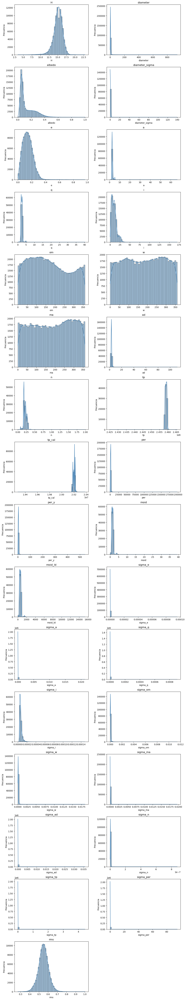

In [22]:
histogramas(df, num)

### 4.2 Boxplots

In [23]:
def boxplots(df, lista):
    n = len(lista)
    rows = math.ceil(n / 2)
    fig, axes = plt.subplots(rows, 2, figsize=(12, 4 * rows))
    axes = axes.flatten()
    for i, var in enumerate(lista):
        sns.boxplot(x = df[var], color = 'salmon', ax = axes[i])
        axes[i].set_title(f'Boxplot de {var}')
        axes[i].set_xlabel(var)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

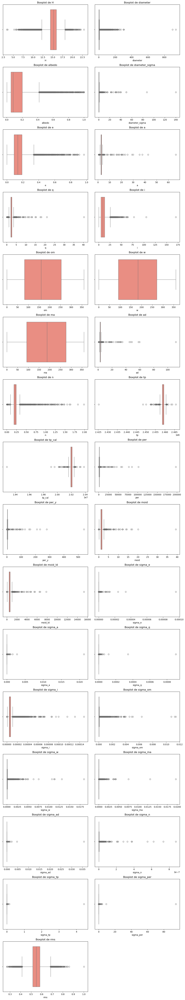

In [24]:
boxplots(df, num)

### 4.3 Countplots

In [25]:
def countplots(df, lista):
    n = len(lista)
    rows = math.ceil(n / 2)
    fig, axes = plt.subplots(rows, 2, figsize=(12, 4 * rows))
    axes = axes.flatten()
    for i, var in enumerate(lista):
        sns.countplot(x=df[var], palette= 'viridis', order = df[var].value_counts().index, ax = axes[i])
        axes[i].set_title(f'Frecuencia de {var}')
        axes[i].set_xlabel(var)
        axes[i].set_ylabel('Cantidad')

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\568886382.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[var], palette= 'viridis', order = df[var].value_counts().index, ax = axes[i])
C:\Users\matia\AppData\Local\Temp\ipykernel_9792\568886382.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[var], palette= 'viridis', order = df[var].value_counts().index, ax = axes[i])


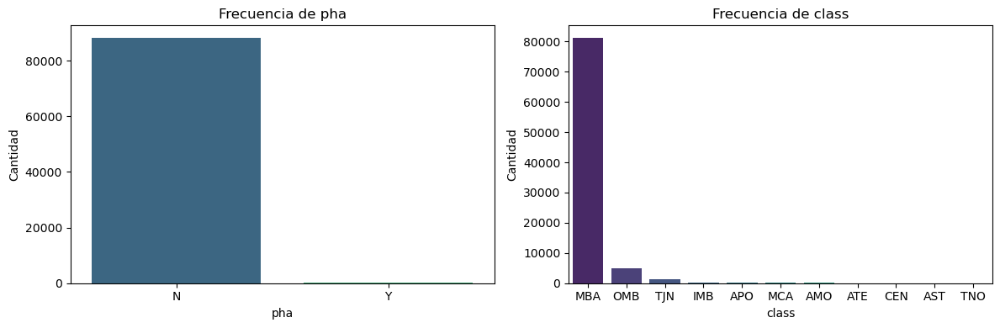

In [26]:
countplots(df, cat)

### 4.3 Matriz de dispersión entre variables fisicas y parametros de la orbita

In [27]:
vars_pairplot = ['H', 'diameter', 'albedo', 'e', 'a', 'i']

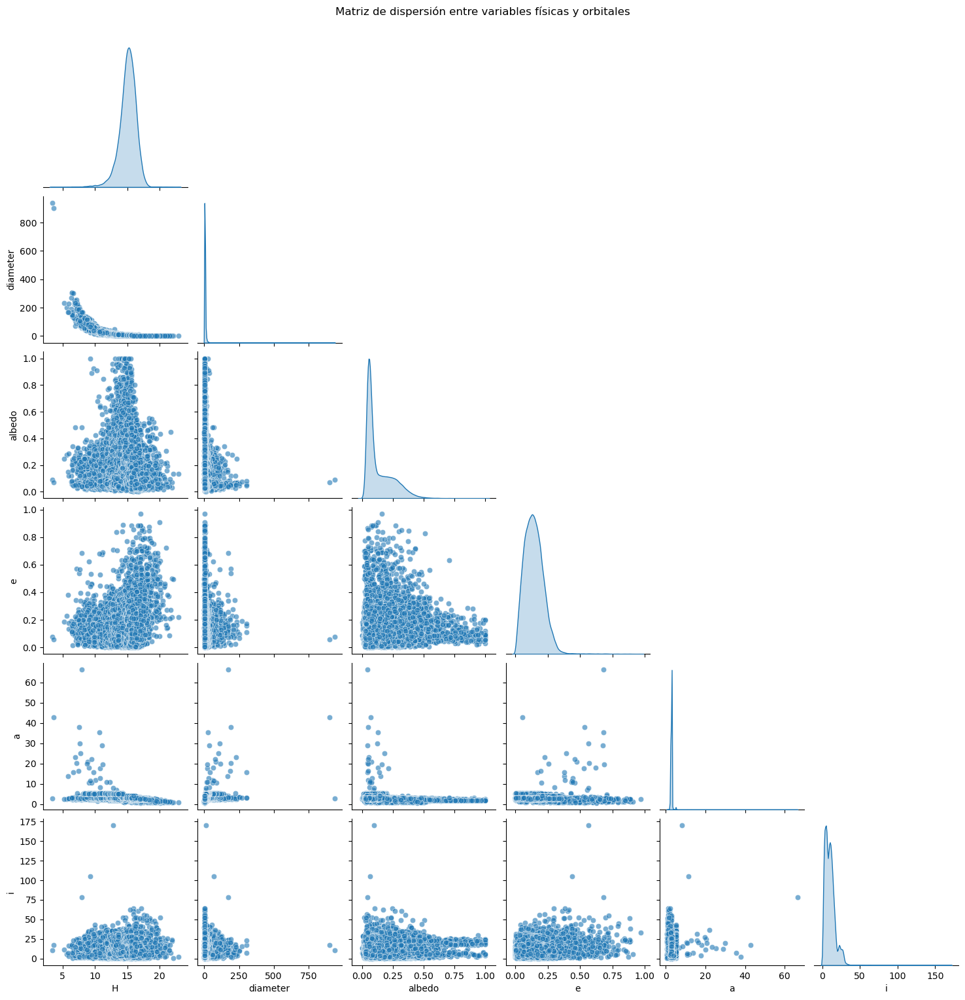

In [29]:
sns.pairplot(df[vars_pairplot], diag_kind = 'kde', corner = True, plot_kws = {'alpha':0.6})
plt.suptitle('Matriz de dispersión entre variables físicas y orbitales', y = 1.02)
plt.show()

### 4.4 Scatterplots

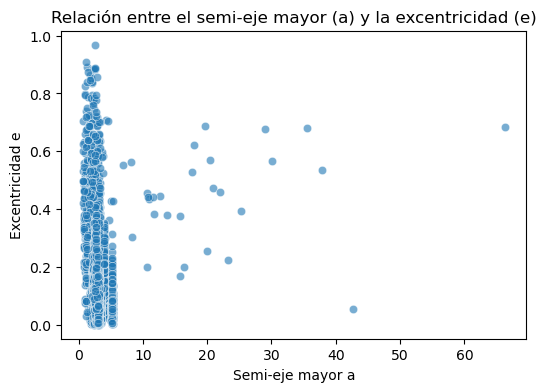

In [30]:
plt.figure(figsize = (6, 4))
sns.scatterplot(data = df, x = 'a', y = 'e', alpha = 0.6)
plt.title('Relación entre el semi-eje mayor (a) y la excentricidad (e)')
plt.xlabel('Semi-eje mayor a')
plt.ylabel('Excentricidad e')
plt.show()

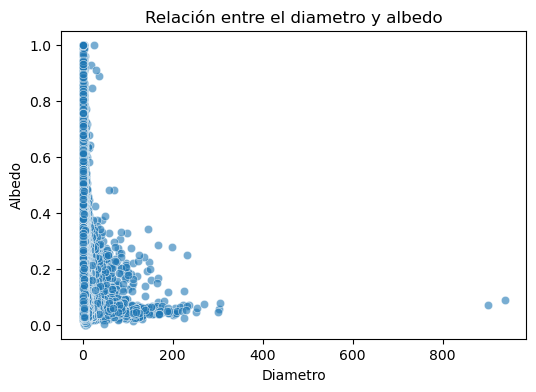

In [31]:
plt.figure(figsize = (6, 4))
sns.scatterplot(data = df, x = 'diameter', y = 'albedo', alpha = 0.6)
plt.title('Relación entre el diametro y albedo')
plt.xlabel('Diametro')
plt.ylabel('Albedo')
plt.show()

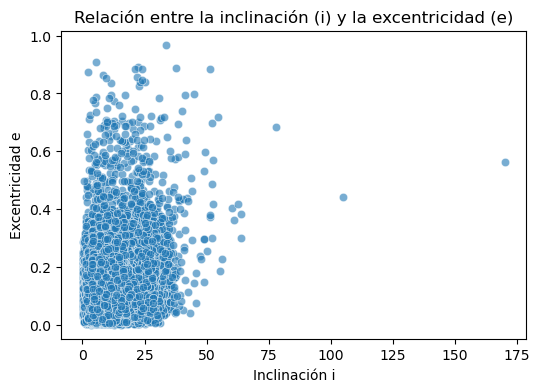

In [32]:
plt.figure(figsize = (6, 4))
sns.scatterplot(data = df, x = 'i', y = 'e', alpha = 0.6)
plt.title('Relación entre la inclinación (i) y la excentricidad (e)')
plt.xlabel('Inclinación i')
plt.ylabel('Excentricidad e')
plt.show()

### 4.5 Boxplots por clases

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\1920890217.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = df, x = 'class', y = var, palette = 'pastel')


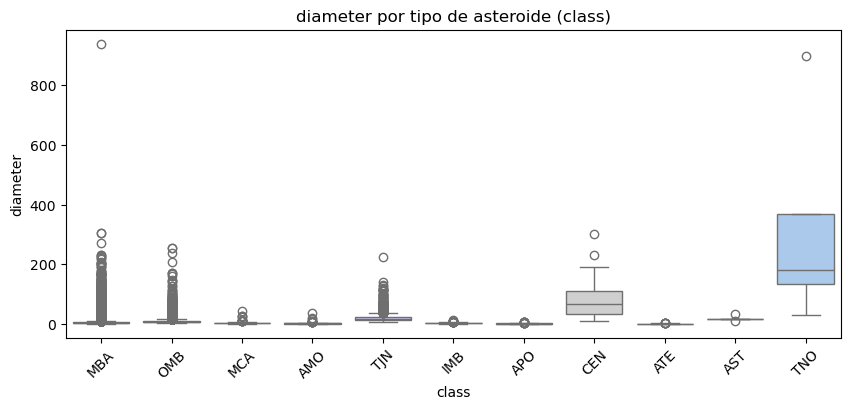

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\1920890217.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = df, x = 'class', y = var, palette = 'pastel')


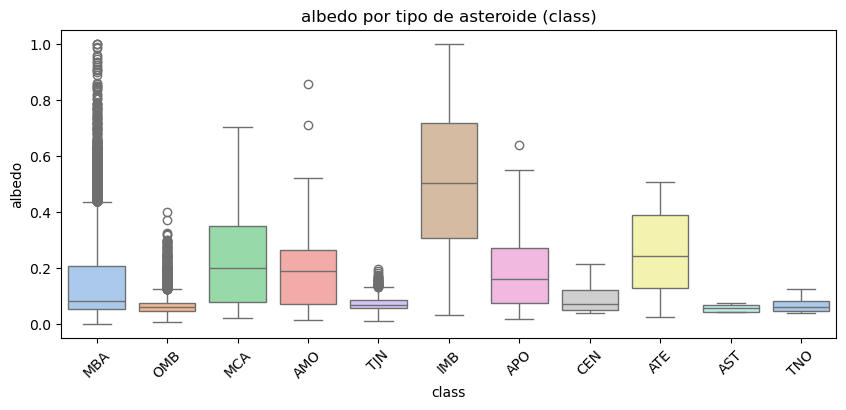

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\1920890217.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = df, x = 'class', y = var, palette = 'pastel')


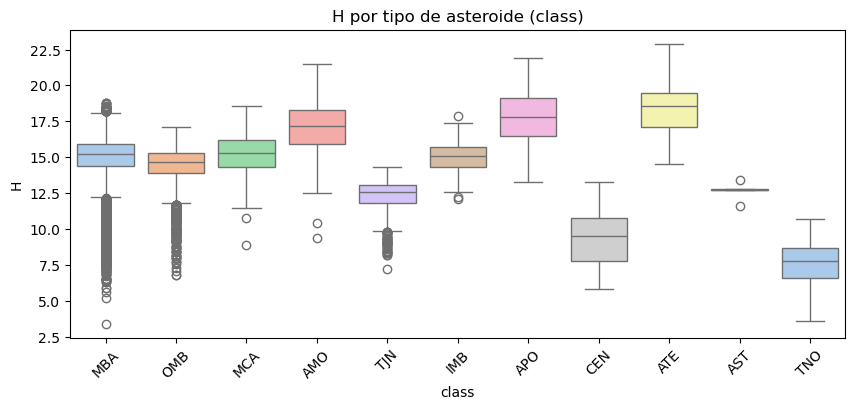

In [33]:
for var in ['diameter', 'albedo', 'H']:
    plt.figure(figsize = (10, 4))
    sns.boxplot(data = df, x = 'class', y = var, palette = 'pastel')
    plt.title(f'{var} por tipo de asteroide (class)')
    plt.xlabel('class')
    plt.ylabel(var)
    plt.xticks(rotation = 45)
    plt.show()

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\3672689793.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = df, x = 'pha', y = var, palette = 'pastel')


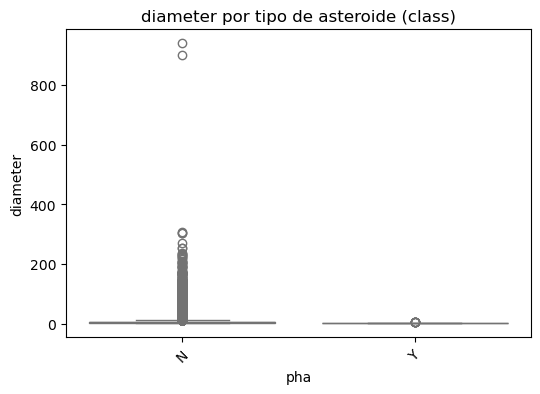

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\3672689793.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = df, x = 'pha', y = var, palette = 'pastel')


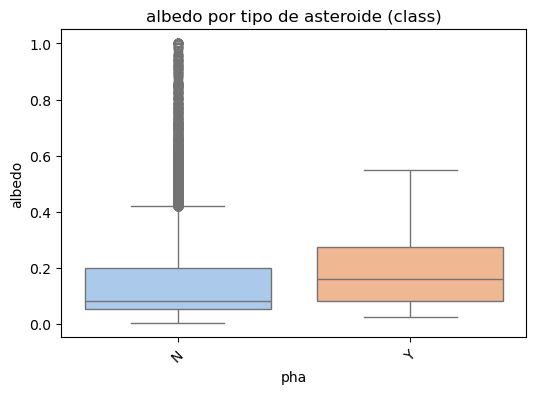

C:\Users\matia\AppData\Local\Temp\ipykernel_9792\3672689793.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = df, x = 'pha', y = var, palette = 'pastel')


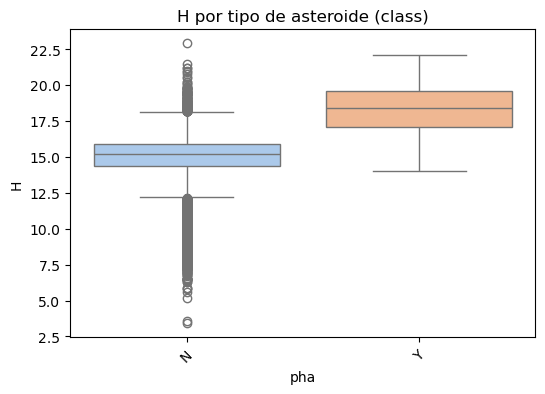

In [34]:
for var in ['diameter', 'albedo', 'H']:
    plt.figure(figsize = (6, 4))
    sns.boxplot(data = df, x = 'pha', y = var, palette = 'pastel')
    plt.title(f'{var} por tipo de asteroide (class)')
    plt.xlabel('pha')
    plt.ylabel(var)
    plt.xticks(rotation = 45)
    plt.show()

### 4.6 Violinplots con la variables fisicas

C:\Users\matia\AppData\Local\Temp\ipykernel_9308\2177329829.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data = df, x = 'class', y =var, palette = 'Set3', cut = 0)


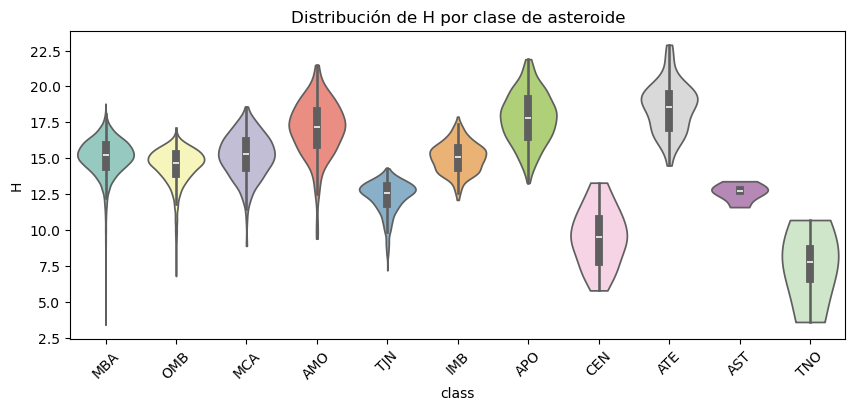

C:\Users\matia\AppData\Local\Temp\ipykernel_9308\2177329829.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data = df, x = 'class', y =var, palette = 'Set3', cut = 0)


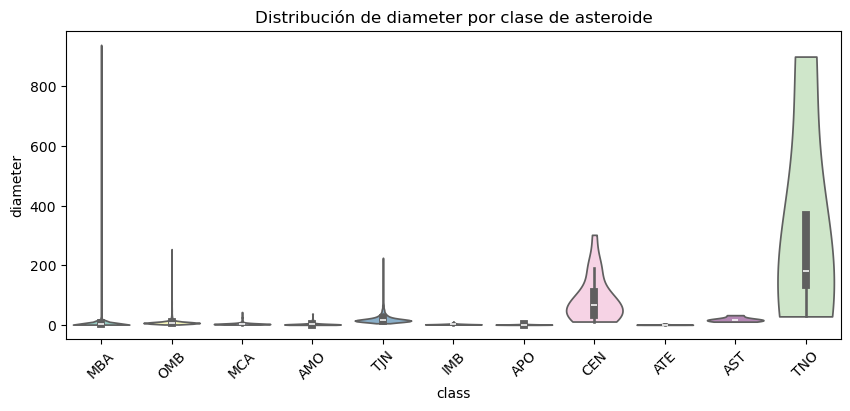

C:\Users\matia\AppData\Local\Temp\ipykernel_9308\2177329829.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data = df, x = 'class', y =var, palette = 'Set3', cut = 0)


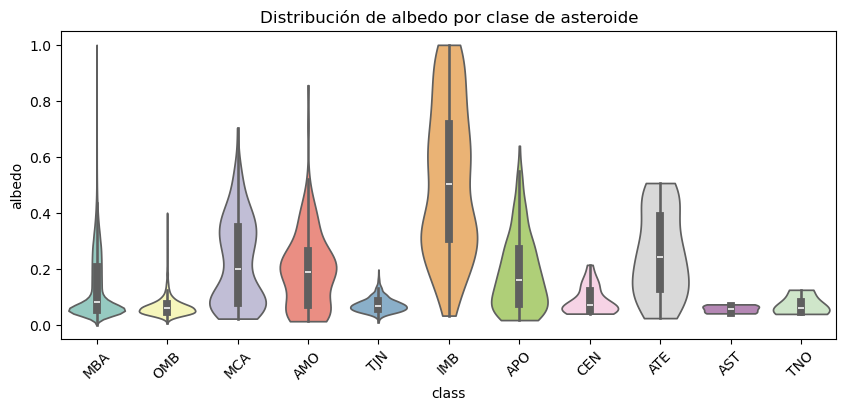

C:\Users\matia\AppData\Local\Temp\ipykernel_9308\2177329829.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data = df, x = 'class', y =var, palette = 'Set3', cut = 0)


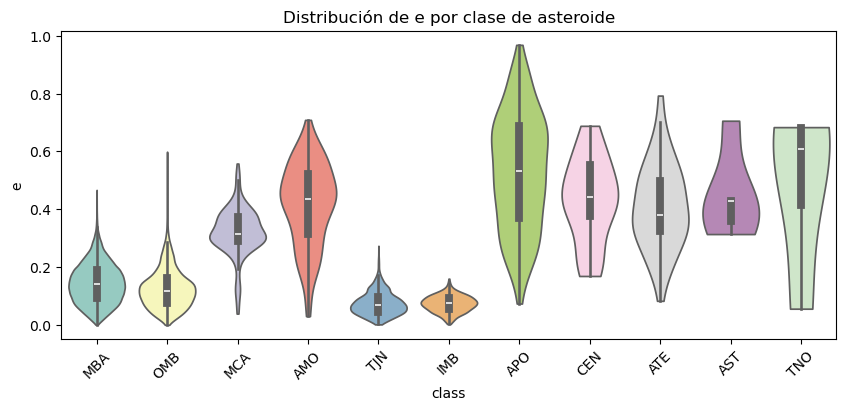

In [5]:
for var in ['H', 'diameter', 'albedo', 'e']:
    plt.figure(figsize = (10, 4))
    sns.violinplot(data = df, x = 'class', y =var, palette = 'Set3', cut = 0)
    plt.title(f'Distribución de {var} por clase de asteroide')
    plt.xlabel('class')
    plt.ylabel(var)
    plt.xticks(rotation = 45)
    plt.show()

### 4.7 Cantidad de asteroides por clase

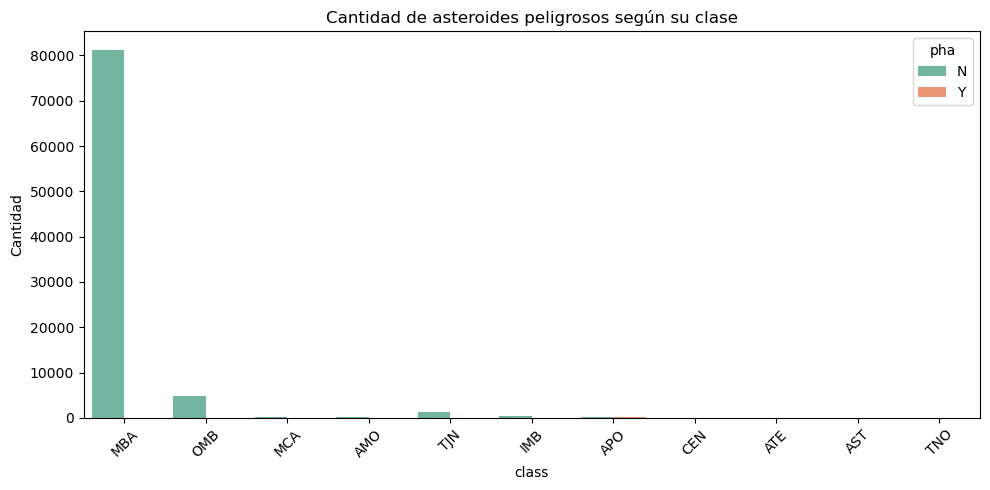

In [5]:
plt.figure(figsize = (10, 5))
sns.countplot(data = df, x = 'class', hue = 'pha', palette = 'Set2')
plt.title('Cantidad de asteroides peligrosos según su clase')
plt.xlabel('class')
plt.ylabel('Cantidad')
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### 4.8 Proporción de peligrosidad por clase

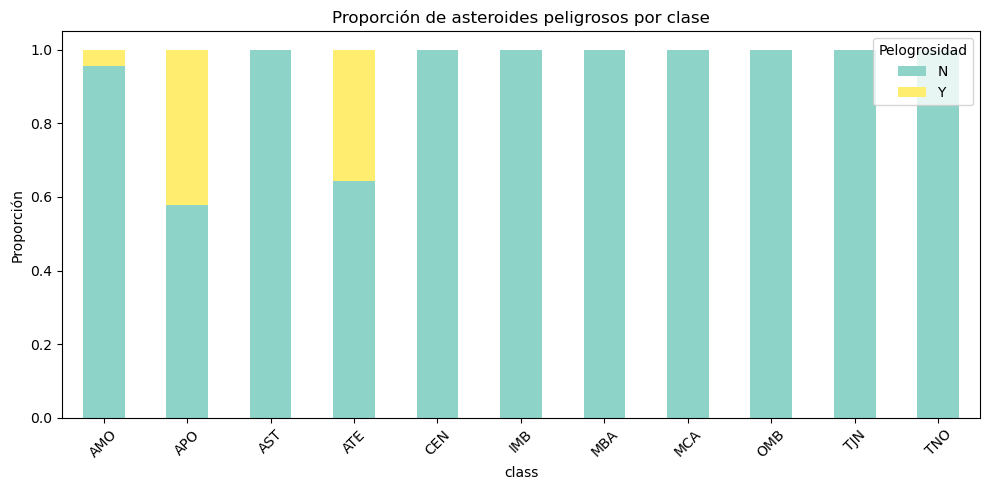

In [7]:
tabla = df.groupby(['class', 'pha']).size().unstack(fill_value = 0)

tabla_prop = tabla.div(tabla.sum(axis = 1), axis = 0)

tabla_prop.plot(kind = 'bar', stacked = True, figsize = (10, 5), colormap = 'Set3')
plt.title('Proporción de asteroides peligrosos por clase')
plt.xlabel('class')
plt.ylabel('Proporción')
plt.legend(title = 'Pelogrosidad', loc = 'upper right')
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### 4.9 Correlación

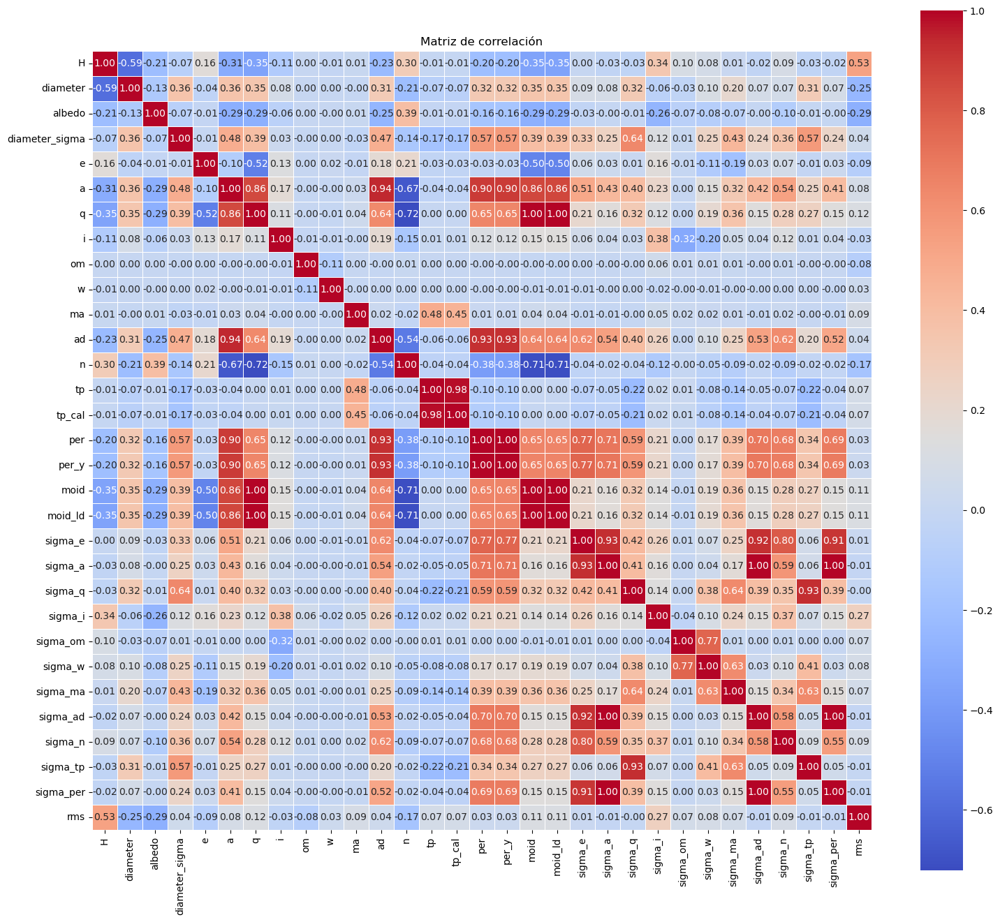

In [13]:
corr = df[num].corr()

plt.figure(figsize = (18, 16))
sns.heatmap(corr, annot = True, fmt = '.2f', cmap = 'coolwarm', square = True, linewidths = 0.5)
plt.title('Matriz de correlación')
plt.show()

### 4.10 Orbitas

### 4.10.1 Orbitas en 2D

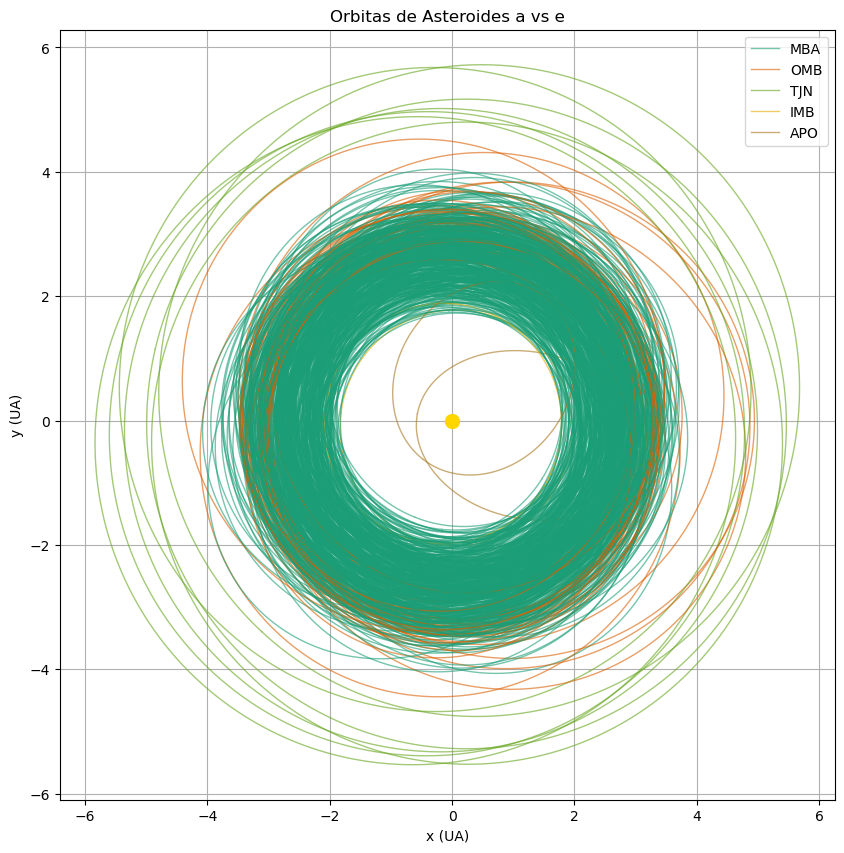

In [12]:
clases = df['class'].dropna().unique()
palette = sns.color_palette('Dark2', len(clases))
colores = {
    clase: color for clase, color in zip(clases, palette)
}

def grafico_orbitas(a, e, w_deg, color = 'gray', label = None):
    w= np.radians(w_deg) # convertir a radianes
    b = a * np.sqrt(1 - e ** 2) # semi-eje menor

    #Parametrizar la elipse
    theta = np.linspace(0, 2 * np.pi, 500)
    r = (a * (1 -e ** 2)) / (1 + e * np.cos(theta))
    x = r * np.cos(theta)
    y = r * np.sin(theta)

    #Rotar por la variable w (argumento del perihelio)
    x_rot = x * np.cos(w) - y * np.sin(w)
    y_rot = x * np.sin(w) + y * np.cos(w)

    plt.plot(x_rot, y_rot, color = color, alpha = 0.6, linewidth = 1, label = label)

plt.figure(figsize = (10, 10))
plt.title('Orbitas de Asteroides a vs e')
plt.xlabel('x (UA)')
plt.ylabel('y (UA)')
plt.grid(True)

df_sample = df.dropna(subset = ['a', 'e', 'w', 'class']).sample(500, random_state = 42)

for _, row in df_sample.iterrows():
    color = colores.get(row['class'], 'gray')
    grafico_orbitas(row['a'], row['e'], row['w'], color = color, label = row['class'])

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc = 'upper right')

plt.scatter(0, 0, color ='gold', s = 100, label = 'Sol', zorder = 5)
plt.show()

### 4.10.2 Orbitas en 3D

In [30]:
def plot_orbits_3d(df, n=500):
    fig = go.Figure()

    colors = px.colors.qualitative.Dark24  # Mejores contrastes
    classes = df['class'].unique()
    class_colors = {cls: colors[i % len(colors)] for i, cls in enumerate(classes)}

    for i, row in df.head(n).iterrows():
        a = row['a']  # semi-eje mayor
        e = row['e']  # excentricidad
        i_deg = row['i']  # inclinacion
        omega_deg = row['om']  
        w_deg = row['w']  # argumento del perihelion

        # Convertir grados a radianes
        i_rad = np.radians(i_deg)
        omega_rad = np.radians(omega_deg)
        w_rad = np.radians(w_deg)

        # Parametrización de la órbita (puntos a lo largo de la elipse)
        theta = np.linspace(0, 2 * np.pi, 200)
        r = a * (1 - e**2) / (1 + e * np.cos(theta))

        # Posiciones en el plano orbital
        x_orb = r * np.cos(theta)
        y_orb = r * np.sin(theta)
        z_orb = np.zeros_like(x_orb)

        # Matriz de rotación a 3D
        R = np.array([
            [np.cos(omega_rad)*np.cos(w_rad) - np.sin(omega_rad)*np.sin(w_rad)*np.cos(i_rad),
             -np.cos(omega_rad)*np.sin(w_rad) - np.sin(omega_rad)*np.cos(w_rad)*np.cos(i_rad),
             np.sin(omega_rad)*np.sin(i_rad)],
            [np.sin(omega_rad)*np.cos(w_rad) + np.cos(omega_rad)*np.sin(w_rad)*np.cos(i_rad),
             -np.sin(omega_rad)*np.sin(w_rad) + np.cos(omega_rad)*np.cos(w_rad)*np.cos(i_rad),
             -np.cos(omega_rad)*np.sin(i_rad)],
            [np.sin(w_rad)*np.sin(i_rad),
             np.cos(w_rad)*np.sin(i_rad),
             np.cos(i_rad)]
        ])

        coords = np.dot(R, np.array([x_orb, y_orb, z_orb]))
        clase = row['class']
        fig.add_trace(go.Scatter3d(
            x=coords[0], y=coords[1], z=coords[2],
            mode='lines',
            line=dict(color=class_colors[clase], width=2),
            name=clase,
            showlegend=False  
        ))

    # Añadir una leyenda
    for cls in classes:
        fig.add_trace(go.Scatter3d(
            x=[None], y=[None], z=[None],
            mode='lines',
            line=dict(color=class_colors[cls], width=4),
            name=cls
        ))

    fig.update_layout(
        title='Órbitas de Asteroides (3D)',
        scene=dict(
            xaxis_title='X (au)',
            yaxis_title='Y (au)',
            zaxis_title='Z (au)'
        ),
        height=700
    )

    fig.show()

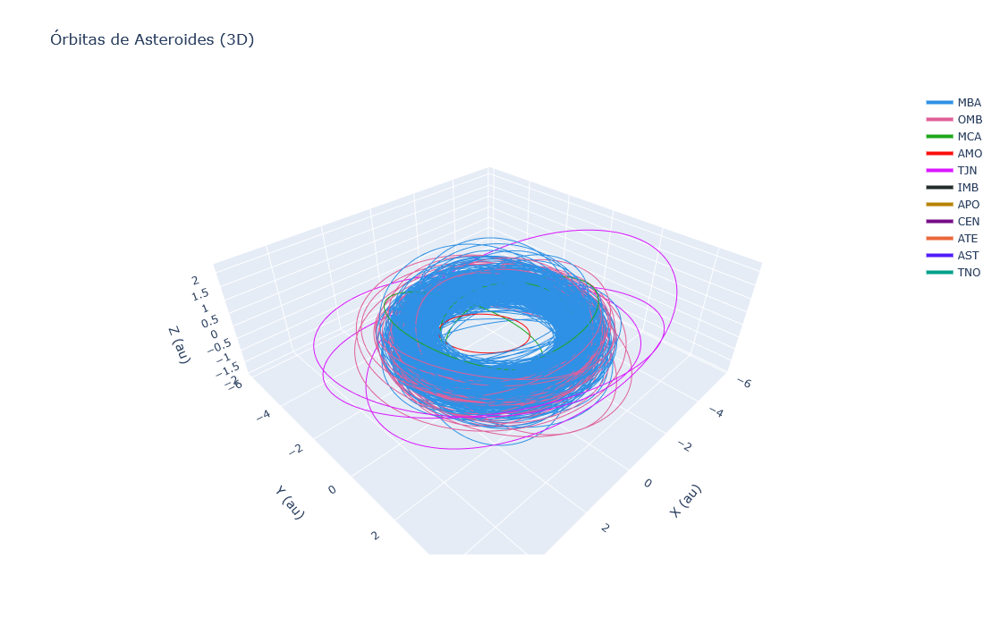

In [31]:
plot_orbits_3d(df, n=500)